In [8]:
from __future__ import print_function, division

from keras.layers import Input, Dense, Flatten, Dropout, Reshape, Concatenate
from keras.layers import BatchNormalization, Activation, Conv2D, Conv2DTranspose
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model
from keras.optimizers import Adam

from keras.datasets import cifar10
import keras.backend as K

import matplotlib.pyplot as plt

import sys
import numpy as np

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [0]:
def get_generator(input_layer, condition_layer):

  merged_input = Concatenate()([input_layer, condition_layer])
  
  hid = Dense(128 * 8 * 8, activation='relu')(merged_input)    
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Reshape((8, 8, 128))(hid)

  hid = Conv2D(128, kernel_size=4, strides=1,padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)    
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1,padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)    
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
                      
  hid = Conv2D(3, kernel_size=5, strides=1, padding="same")(hid)
  out = Activation("tanh")(hid)

  model = Model(inputs=[input_layer, condition_layer], outputs=out)
  model.summary()
  
  return model, out

In [0]:
def get_discriminator(input_layer, condition_layer):
  hid = Conv2D(128, kernel_size=3, strides=1, padding='same')(input_layer)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Flatten()(hid)
  
  merged_layer = Concatenate()([hid, condition_layer])
  hid = Dense(512, activation='relu')(merged_layer)
  #hid = Dropout(0.4)(hid)
  out = Dense(1, activation='sigmoid')(hid)

  model = Model(inputs=[input_layer, condition_layer], outputs=out)

  model.summary()

  return model, out

In [0]:
from keras.preprocessing import image

def one_hot_encode(y):
  z = np.zeros((len(y), 10))
  idx = np.arange(len(y))
  z[idx, y] = 1
  return z

def generate_noise(n_samples, noise_dim):
  X = np.random.normal(0, 1, size=(n_samples, noise_dim))
  return X

def generate_random_labels(n):
  y = np.random.choice(10, n)
  y = one_hot_encode(y)
  return y

tags = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']
  
def show_samples(batchidx):
  fig, axs = plt.subplots(5, 6, figsize=(10,6))
  plt.subplots_adjust(hspace=0.3, wspace=0.1)
  #fig, axs = plt.subplots(5, 6)
  #fig.tight_layout()
  for classlabel in range(10):
    row = int(classlabel / 2)
    coloffset = (classlabel % 2) * 3
    lbls = one_hot_encode([classlabel] * 3)
    noise = generate_noise(3, 100)
    gen_imgs = generator.predict([noise, lbls])

    for i in range(3):
        # Dont scale the images back, let keras handle it
        img = image.array_to_img(gen_imgs[i], scale=True)
        axs[row,i+coloffset].imshow(img)
        axs[row,i+coloffset].axis('off')
        if i ==1:
          axs[row,i+coloffset].set_title(tags[classlabel])
  plt.show()
  plt.close()

In [12]:
img_input = Input(shape=(32,32,3))
disc_condition_input = Input(shape=(10,))

discriminator, disc_out = get_discriminator(img_input, disc_condition_input)
discriminator.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy', metrics=['accuracy'])

discriminator.trainable = False

noise_input = Input(shape=(100,))
gen_condition_input = Input(shape=(10,))
generator, gen_out = get_generator(noise_input, gen_condition_input)

gan_input = Input(shape=(100,))
x = generator([gan_input, gen_condition_input])
gan_out = discriminator([x, disc_condition_input])
gan = Model(inputs=[gan_input, gen_condition_input, disc_condition_input], output=gan_out)
gan.summary()

gan.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy')

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 32, 32, 128)  3584        input_6[0][0]                    
__________________________________________________________________________________________________
batch_normalization_12 (BatchNo (None, 32, 32, 128)  512         conv2d_10[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_12 (LeakyReLU)      (None, 32, 32, 128)  0           batch_normalization_12[0][0]     
__________________________________________________________________________________________________
conv2d_11 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("mo...)`
  app.launch_new_instance()


In [13]:
BATCH_SIZE = 16


(X_train, y_train), (X_test, _) = cifar10.load_data()


X_train = (X_train - 127.5) / 127.5


y_train = one_hot_encode(y_train[:,0])

print ("Training shape: {}".format(X_train.shape))
 
num_batches = int(X_train.shape[0]/BATCH_SIZE)

Training shape: (50000, 32, 32, 3)


In [0]:
exp_replay = []

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


	Epoch: 1, Generator Loss: 0.00011959275007247924, Discriminator Loss: [0.00037666 0.        ]


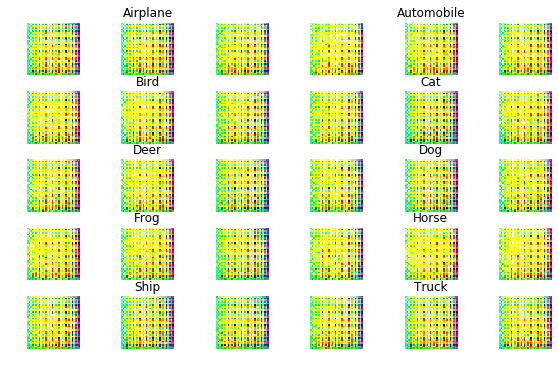

	Epoch: 2, Generator Loss: 0.00422482125878334, Discriminator Loss: [0.0013256 0.       ]


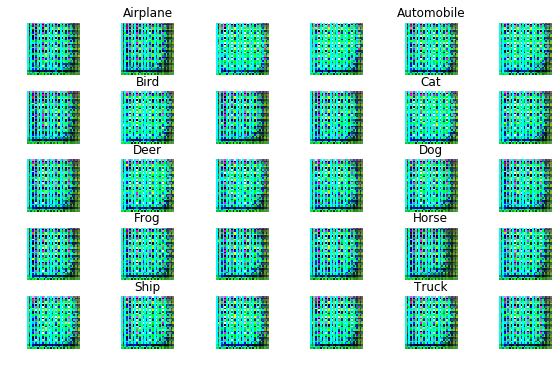

	Epoch: 3, Generator Loss: 0.006522197229862213, Discriminator Loss: [0.00125547 0.        ]


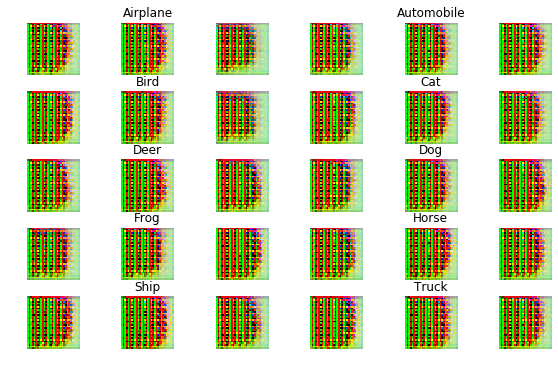

	Epoch: 4, Generator Loss: 0.010196928386688233, Discriminator Loss: [0.0011445 0.       ]


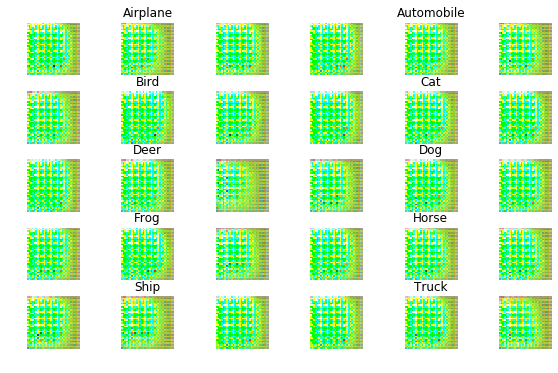

	Epoch: 5, Generator Loss: 0.009483133869171143, Discriminator Loss: [0.00139855 0.        ]


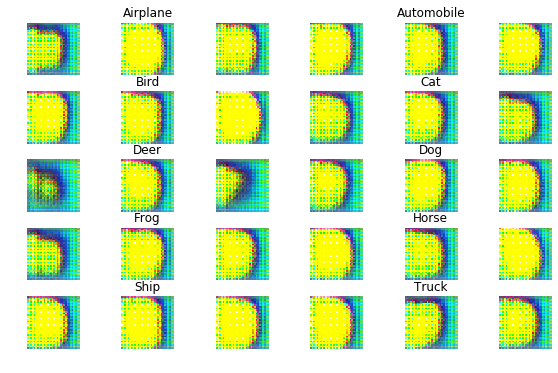

	Epoch: 6, Generator Loss: 0.007038148164749146, Discriminator Loss: [0.00119793 0.        ]


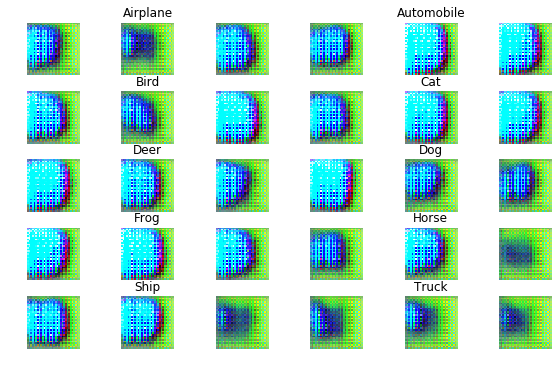

	Epoch: 7, Generator Loss: 0.012480435047149659, Discriminator Loss: [0.00126437 0.        ]


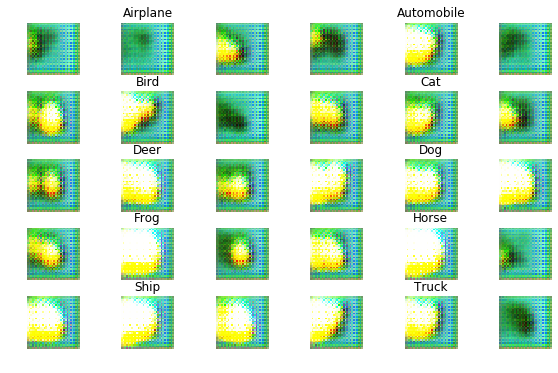

	Epoch: 8, Generator Loss: 0.014471870460510254, Discriminator Loss: [0.00138081 0.        ]


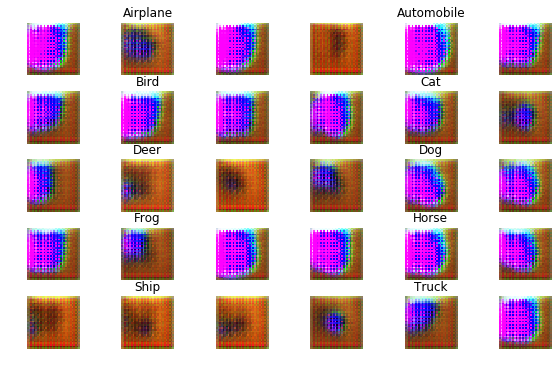

	Epoch: 9, Generator Loss: 0.012741145000457763, Discriminator Loss: [0.00170306 0.        ]


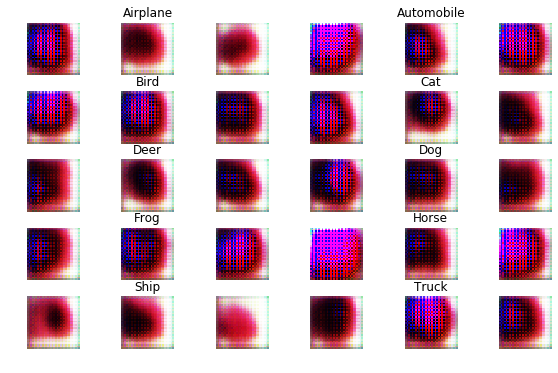

	Epoch: 10, Generator Loss: 0.014130146560668945, Discriminator Loss: [0.00159303 0.        ]


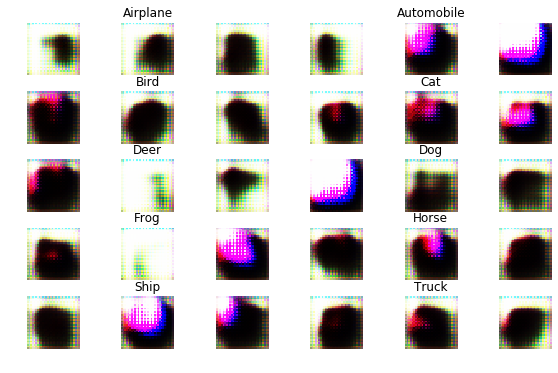

	Epoch: 11, Generator Loss: 0.014871697845458984, Discriminator Loss: [0.00143967 0.        ]


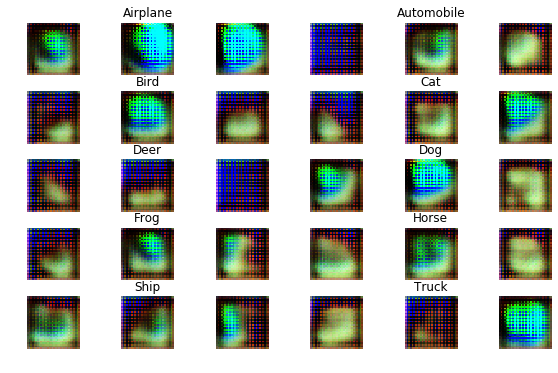

	Epoch: 12, Generator Loss: 0.014246169586181641, Discriminator Loss: [0.00133914 0.        ]


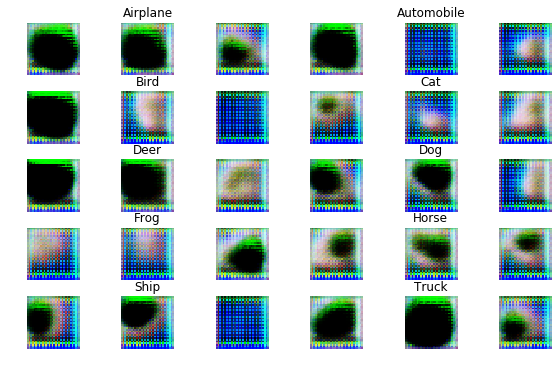

	Epoch: 13, Generator Loss: 0.013855503044128418, Discriminator Loss: [0.00128847 0.        ]


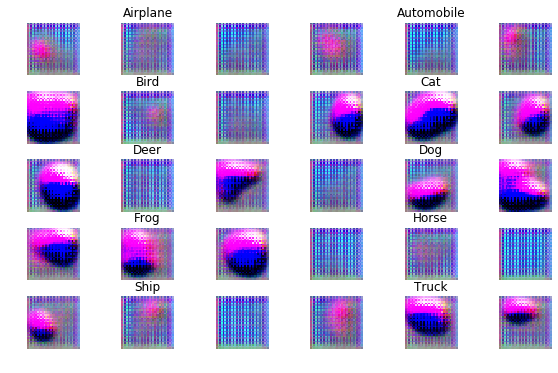

	Epoch: 14, Generator Loss: 0.011914358787536621, Discriminator Loss: [0.00149233 0.        ]


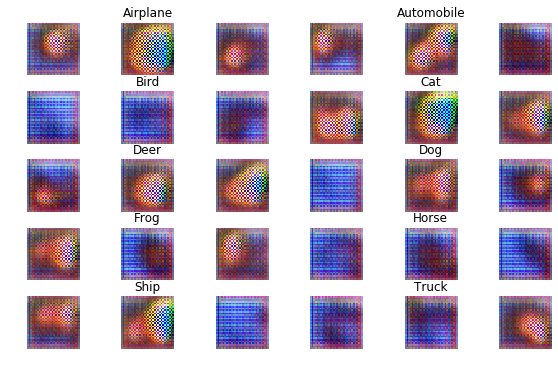

	Epoch: 15, Generator Loss: 0.007236468238830567, Discriminator Loss: [0.00148052 0.        ]


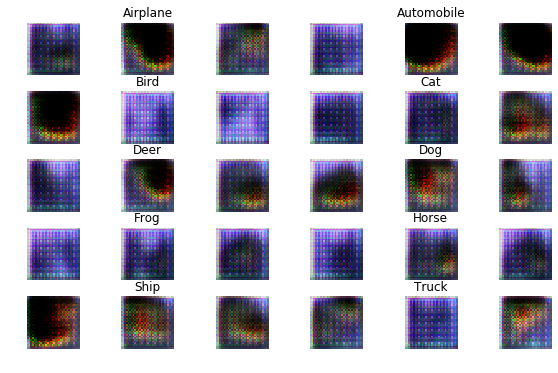

	Epoch: 16, Generator Loss: 0.01593880256652832, Discriminator Loss: [0.00186122 0.        ]


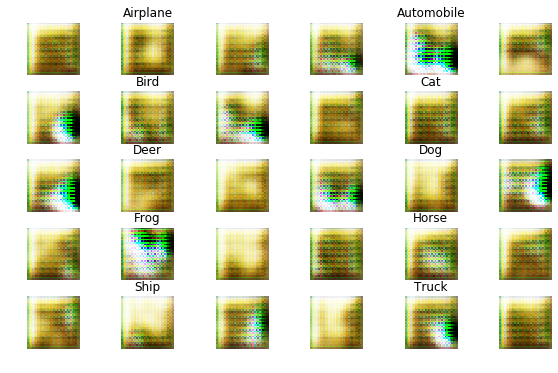

	Epoch: 17, Generator Loss: 0.007218164224624634, Discriminator Loss: [0.00128154 0.        ]


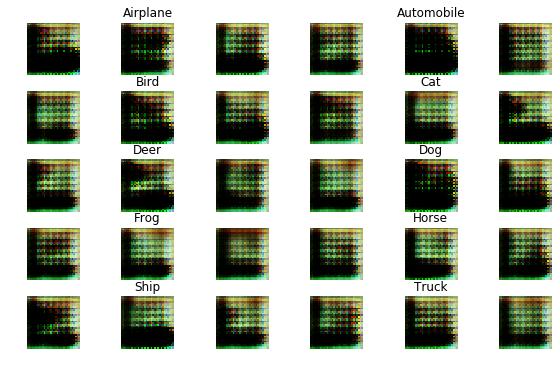

	Epoch: 18, Generator Loss: 0.007562664866447449, Discriminator Loss: [0.00122834 0.        ]


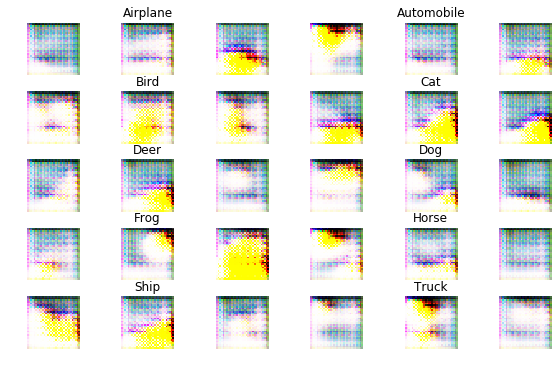

	Epoch: 19, Generator Loss: 0.006067444248199463, Discriminator Loss: [0.00113034 0.        ]


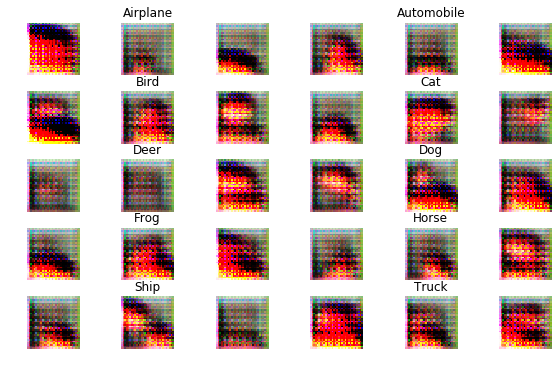

	Epoch: 20, Generator Loss: 0.012717057762145996, Discriminator Loss: [0.00151021 0.        ]


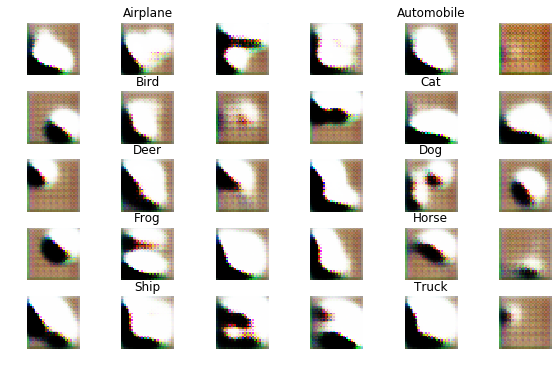

	Epoch: 21, Generator Loss: 0.011563149909973144, Discriminator Loss: [0.00127964 0.        ]


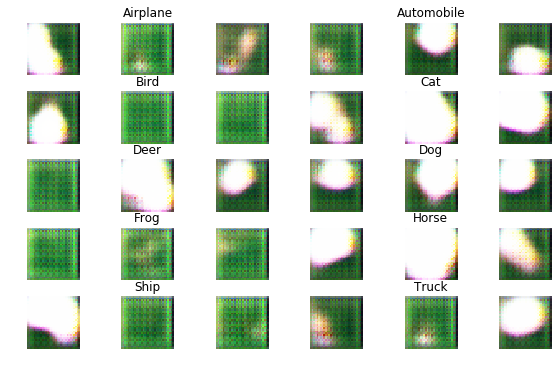

	Epoch: 22, Generator Loss: 0.009320357036590576, Discriminator Loss: [0.00126849 0.        ]


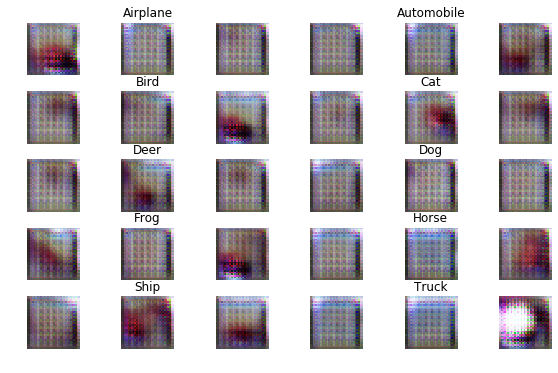

	Epoch: 23, Generator Loss: 0.005566060352325439, Discriminator Loss: [0.00134726 0.        ]


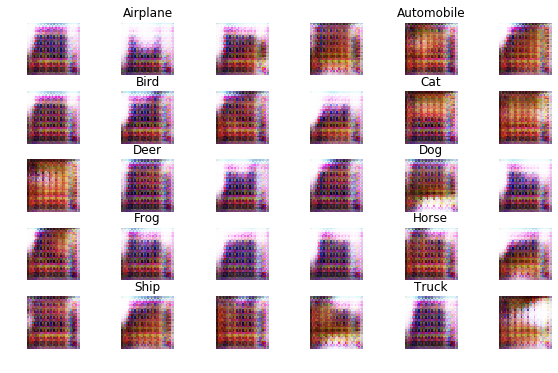

	Epoch: 24, Generator Loss: 0.01479089723587036, Discriminator Loss: [0.00167664 0.        ]


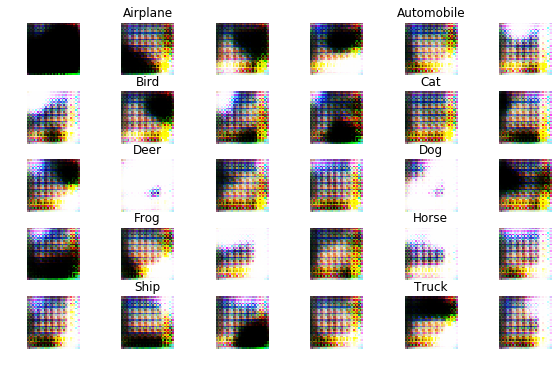

	Epoch: 25, Generator Loss: 0.011494018783569336, Discriminator Loss: [0.00119752 0.        ]


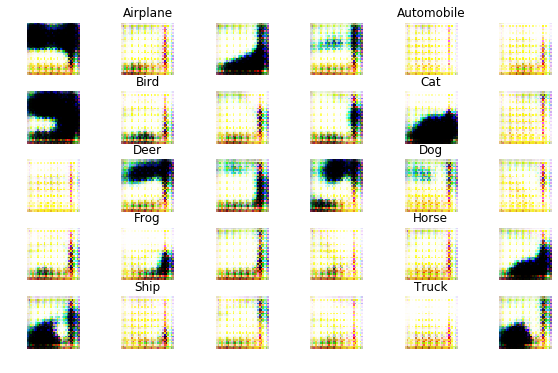

	Epoch: 26, Generator Loss: 0.012238249549865722, Discriminator Loss: [0.00105125 0.        ]


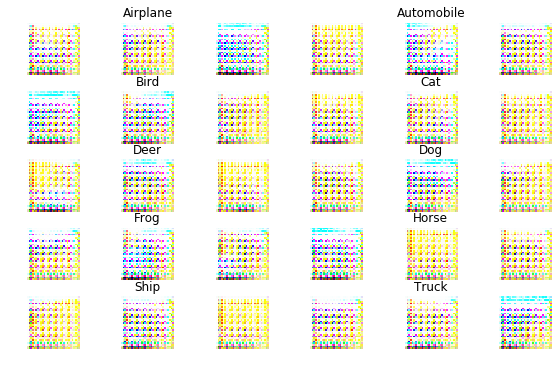

	Epoch: 27, Generator Loss: 0.01644809471130371, Discriminator Loss: [0.00115222 0.        ]


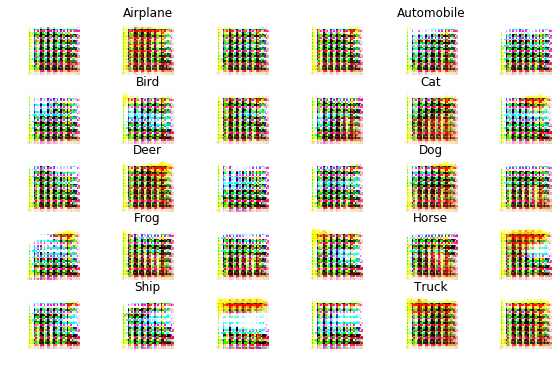

	Epoch: 28, Generator Loss: 0.007898683519363403, Discriminator Loss: [0.00115773 0.        ]


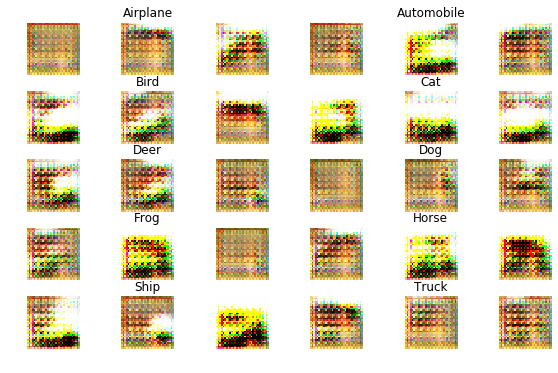

	Epoch: 29, Generator Loss: 0.00765518256187439, Discriminator Loss: [0.00130317 0.        ]


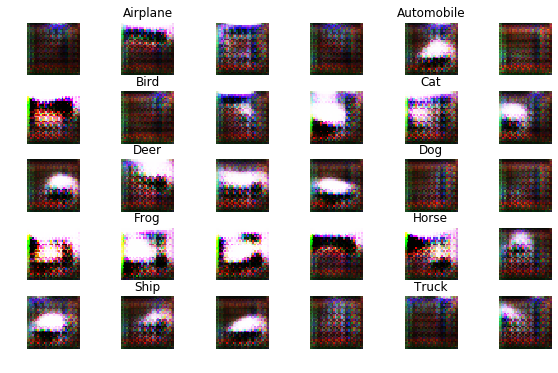

	Epoch: 30, Generator Loss: 0.010407300720214844, Discriminator Loss: [0.00114594 0.        ]


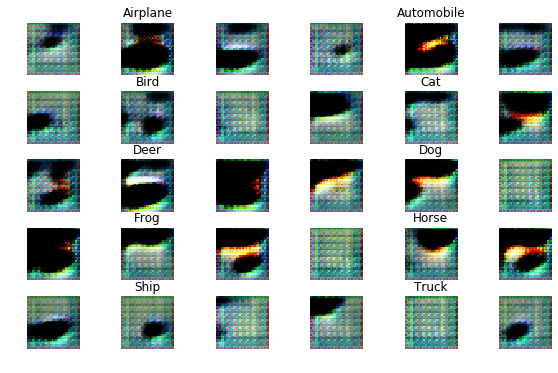

	Epoch: 31, Generator Loss: 0.010372549934387207, Discriminator Loss: [0.00121698 0.        ]


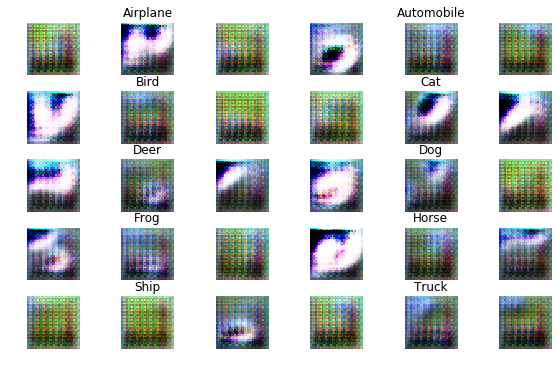

	Epoch: 32, Generator Loss: 0.012518572616577149, Discriminator Loss: [0.00148643 0.        ]


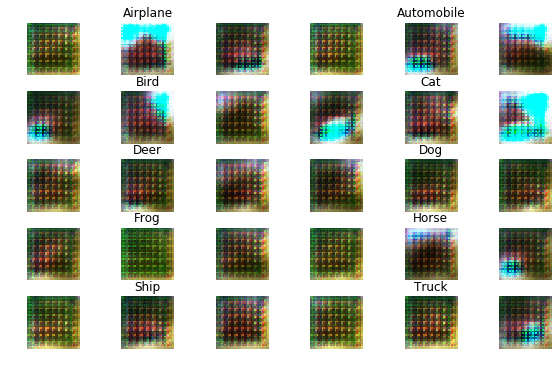

	Epoch: 33, Generator Loss: 0.010809541931152343, Discriminator Loss: [0.00125387 0.        ]


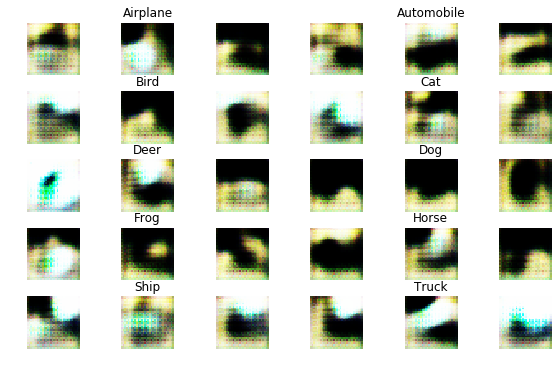

	Epoch: 34, Generator Loss: 0.013395584564208984, Discriminator Loss: [0.00122446 0.        ]


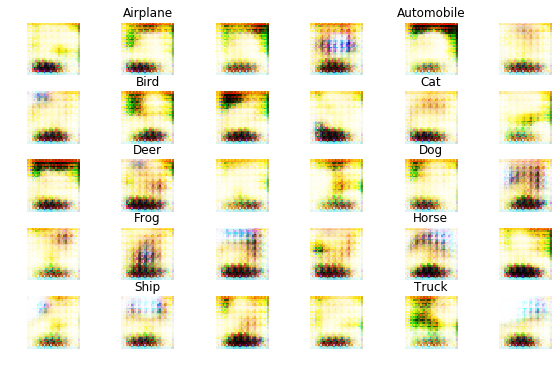

	Epoch: 35, Generator Loss: 0.010482542686462402, Discriminator Loss: [0.00107956 0.        ]


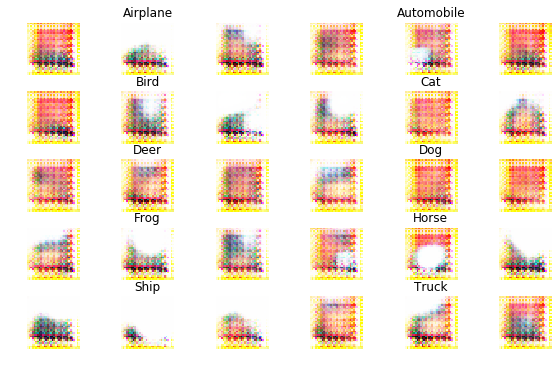

	Epoch: 36, Generator Loss: 0.006799160013198853, Discriminator Loss: [0.00117714 0.        ]


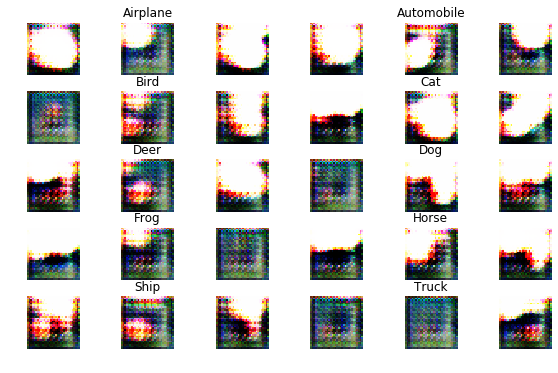

	Epoch: 37, Generator Loss: 0.010099516973495483, Discriminator Loss: [0.00146247 0.        ]


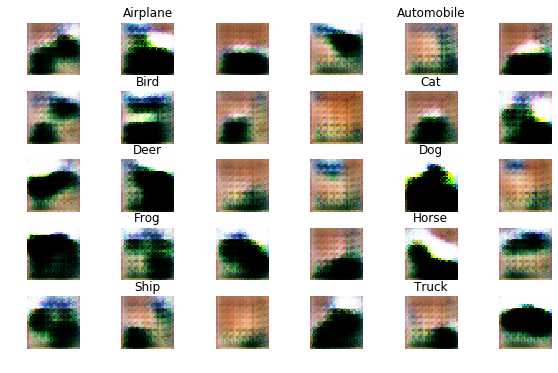

	Epoch: 38, Generator Loss: 0.009311595916748046, Discriminator Loss: [0.00141631 0.        ]


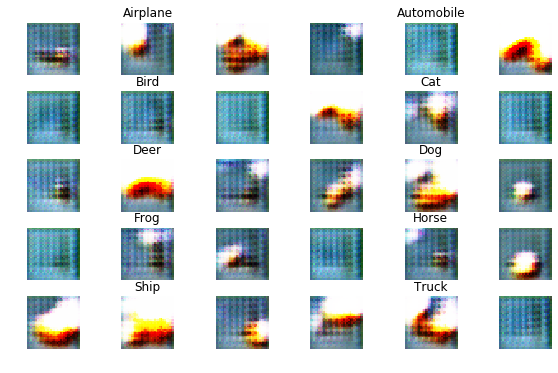

	Epoch: 39, Generator Loss: 0.014017405166625977, Discriminator Loss: [0.00123638 0.        ]


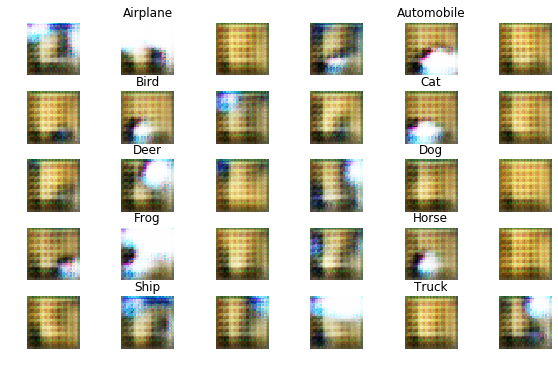

	Epoch: 40, Generator Loss: 0.011294888572692872, Discriminator Loss: [0.00137435 0.        ]


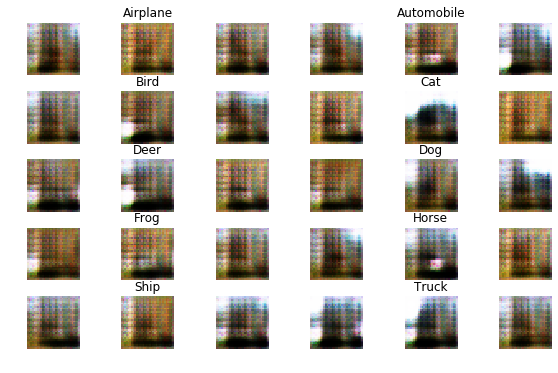

	Epoch: 41, Generator Loss: 0.009910672054290772, Discriminator Loss: [0.00127079 0.        ]


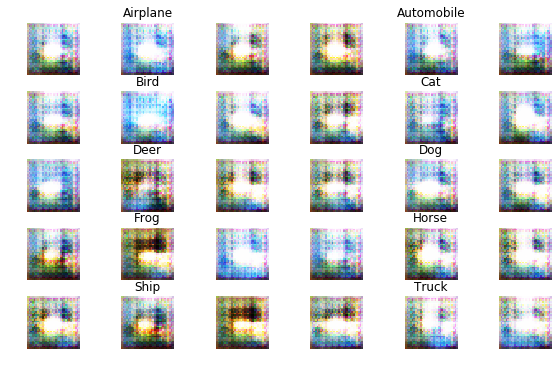

	Epoch: 42, Generator Loss: 0.01437257049560547, Discriminator Loss: [0.00112685 0.        ]


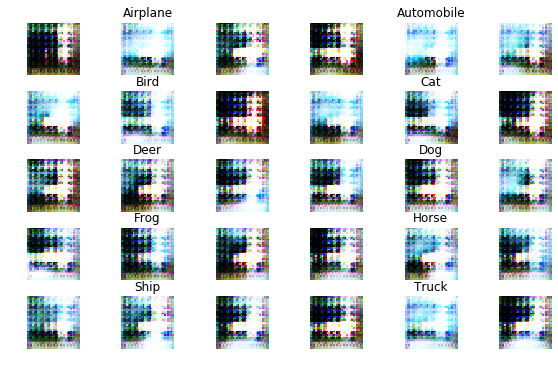

	Epoch: 43, Generator Loss: 0.012158604278564453, Discriminator Loss: [0.0010788 0.       ]


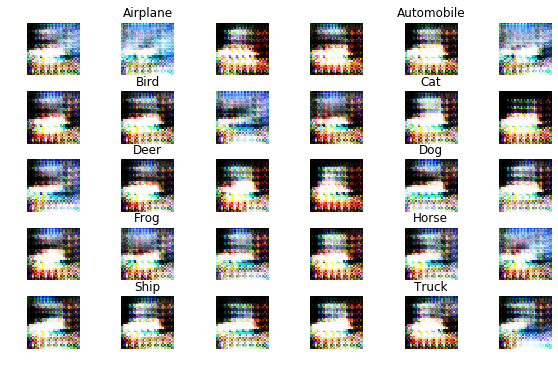

	Epoch: 44, Generator Loss: 0.008779636783599854, Discriminator Loss: [0.00109423 0.        ]


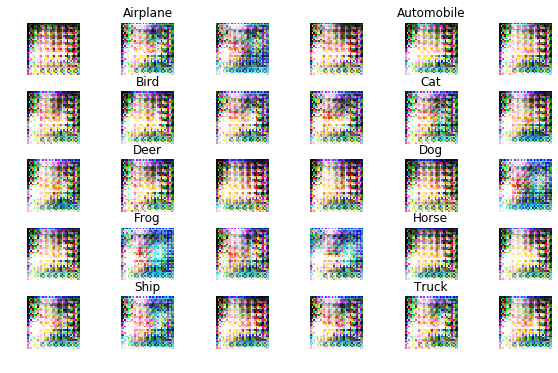

	Epoch: 45, Generator Loss: 0.009218106088638305, Discriminator Loss: [0.00105203 0.        ]


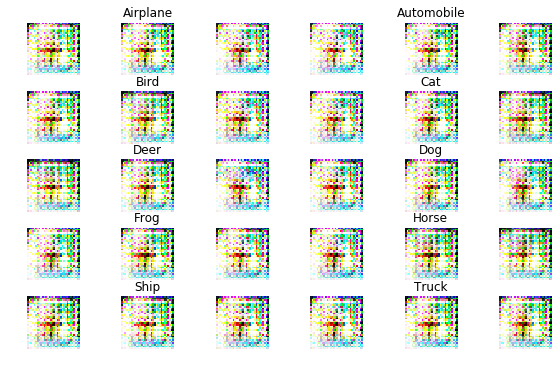

	Epoch: 46, Generator Loss: 0.010852640914916991, Discriminator Loss: [0.00097157 0.        ]


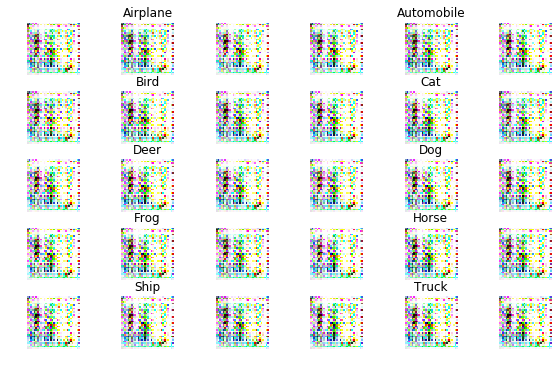

	Epoch: 47, Generator Loss: 0.014136029663085938, Discriminator Loss: [0.0009661 0.       ]


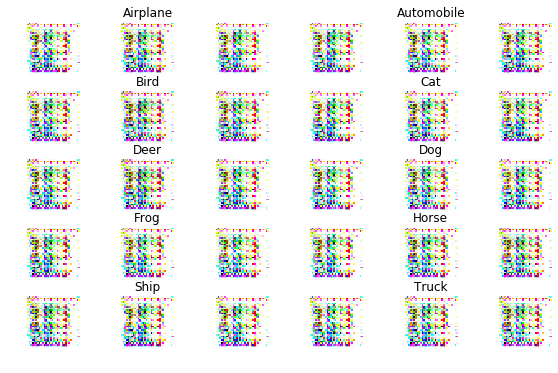

	Epoch: 48, Generator Loss: 0.014389100494384766, Discriminator Loss: [0.00098585 0.        ]


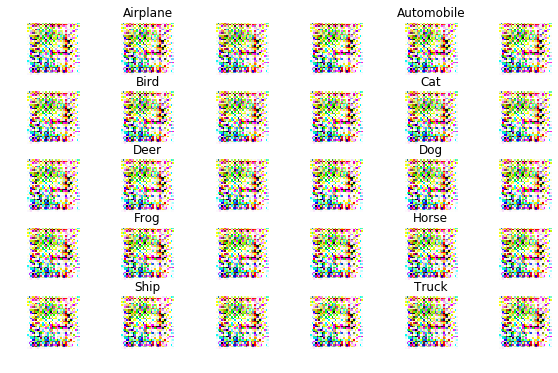

	Epoch: 49, Generator Loss: 0.013661531753540039, Discriminator Loss: [0.00098963 0.        ]


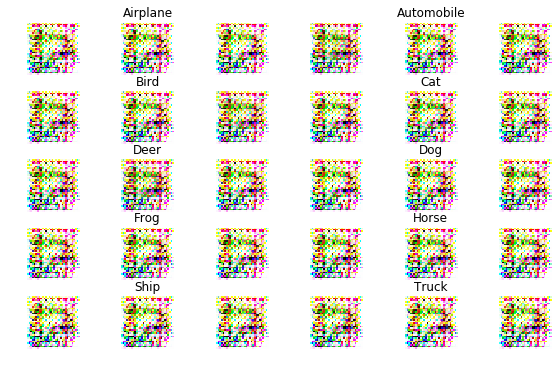

	Epoch: 50, Generator Loss: 0.014305572738647462, Discriminator Loss: [0.00097447 0.        ]


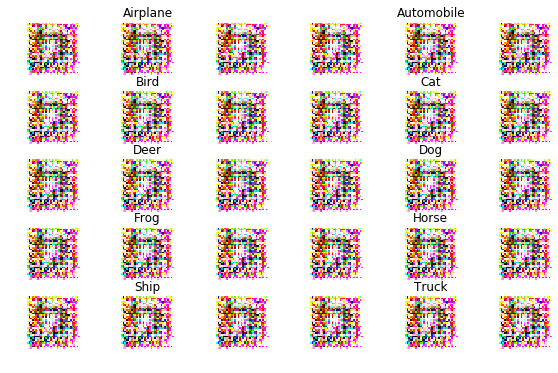

	Epoch: 51, Generator Loss: 0.015186259994506835, Discriminator Loss: [0.00098552 0.        ]


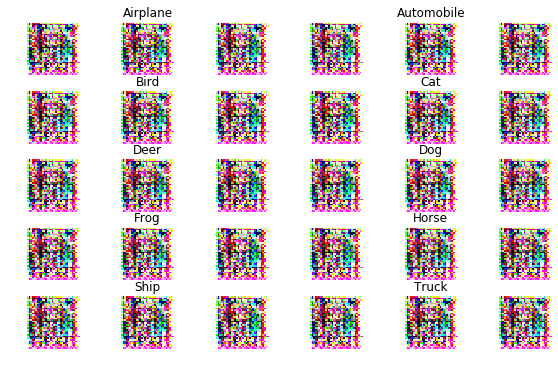

	Epoch: 52, Generator Loss: 0.015083375930786133, Discriminator Loss: [0.00100133 0.        ]


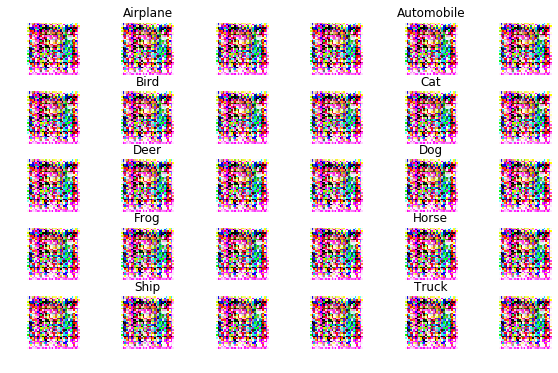

	Epoch: 53, Generator Loss: 0.014714366607666016, Discriminator Loss: [0.00099163 0.        ]


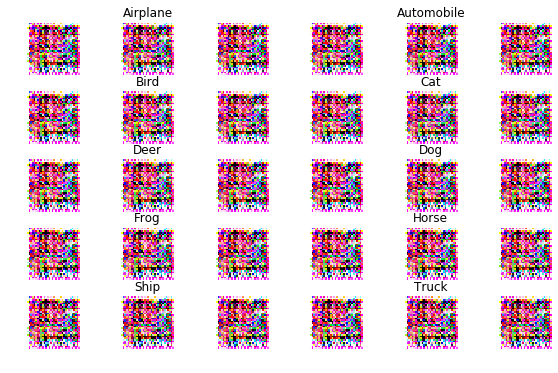

	Epoch: 54, Generator Loss: 0.01612551872253418, Discriminator Loss: [0.00101476 0.        ]


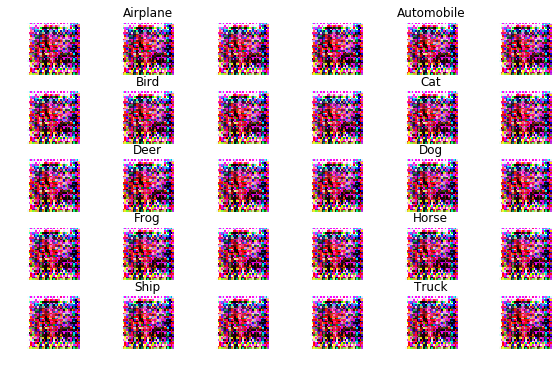

	Epoch: 55, Generator Loss: 0.016007246856689455, Discriminator Loss: [0.00100927 0.        ]


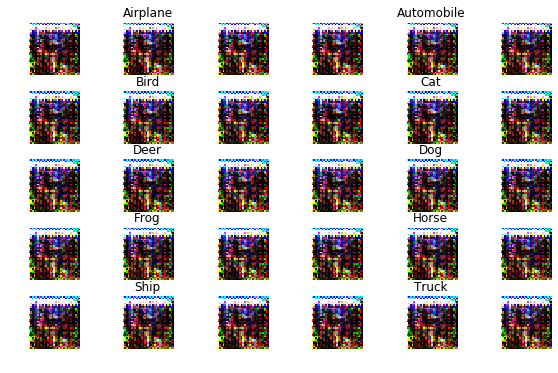

	Epoch: 56, Generator Loss: 0.016062822494506836, Discriminator Loss: [0.00104225 0.        ]


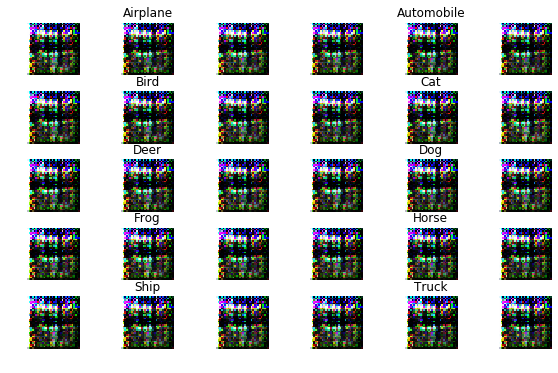

	Epoch: 57, Generator Loss: 0.015468708267211913, Discriminator Loss: [0.0010137 0.       ]


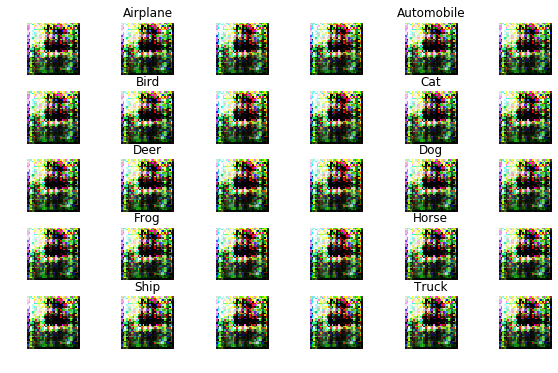

	Epoch: 58, Generator Loss: 0.015393127136230469, Discriminator Loss: [0.00100548 0.        ]


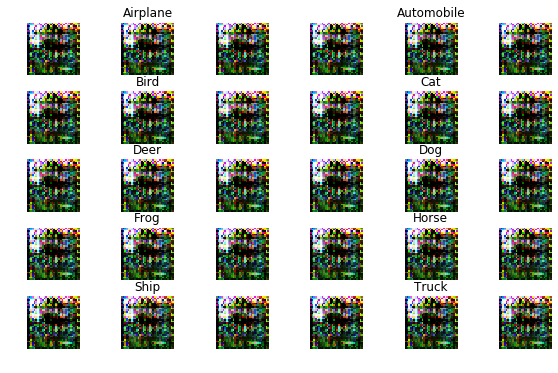

	Epoch: 59, Generator Loss: 0.01625077964782715, Discriminator Loss: [0.00107866 0.        ]


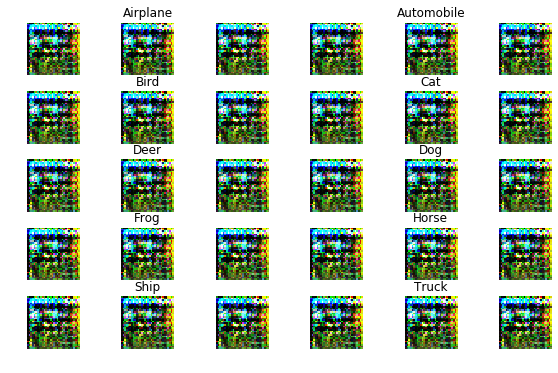

	Epoch: 60, Generator Loss: 0.017451941604614257, Discriminator Loss: [0.0010188 0.       ]


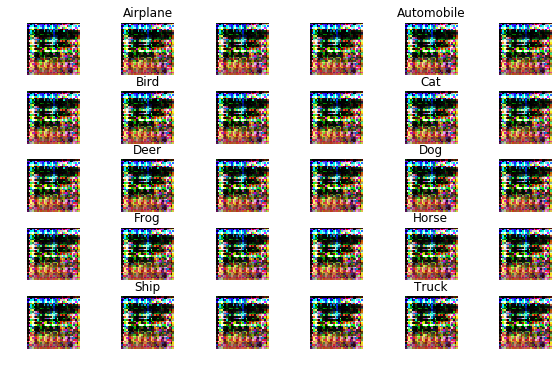

	Epoch: 61, Generator Loss: 0.014208452835083008, Discriminator Loss: [0.00097414 0.        ]


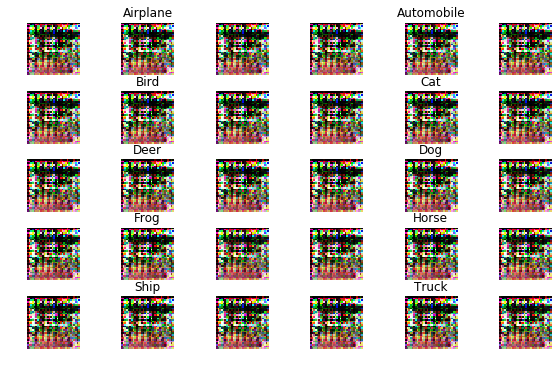

	Epoch: 62, Generator Loss: 0.015170888442993163, Discriminator Loss: [0.00101612 0.        ]


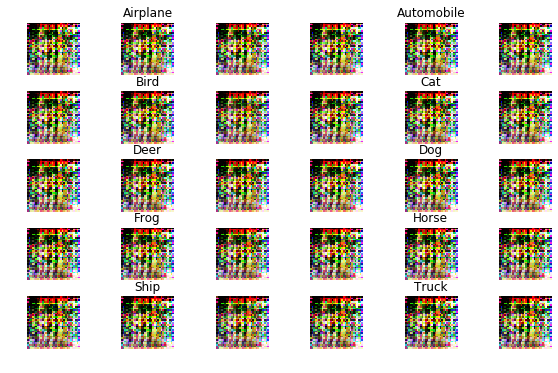

	Epoch: 63, Generator Loss: 0.015535760192871093, Discriminator Loss: [0.00097454 0.        ]


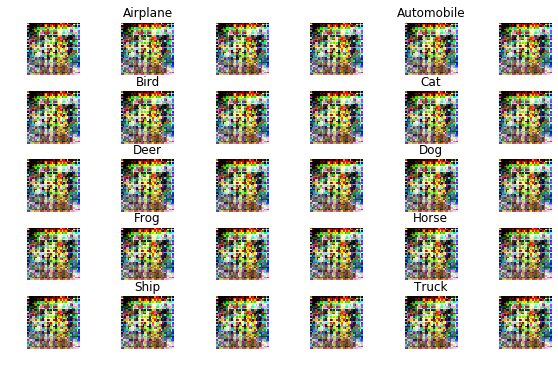

	Epoch: 64, Generator Loss: 0.015625500564575196, Discriminator Loss: [0.00100036 0.        ]


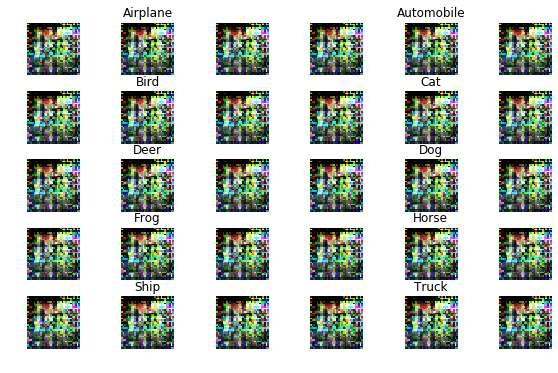

	Epoch: 65, Generator Loss: 0.015313408279418945, Discriminator Loss: [0.00099537 0.        ]


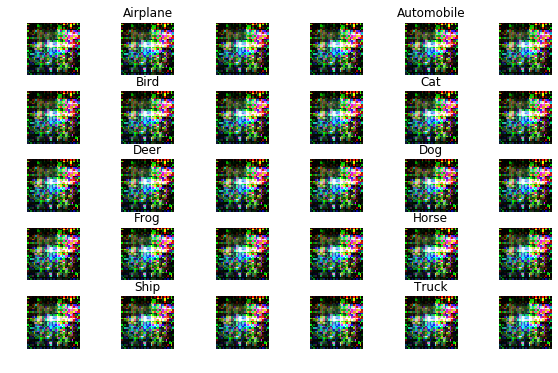

	Epoch: 66, Generator Loss: 0.01538802001953125, Discriminator Loss: [0.00104818 0.        ]


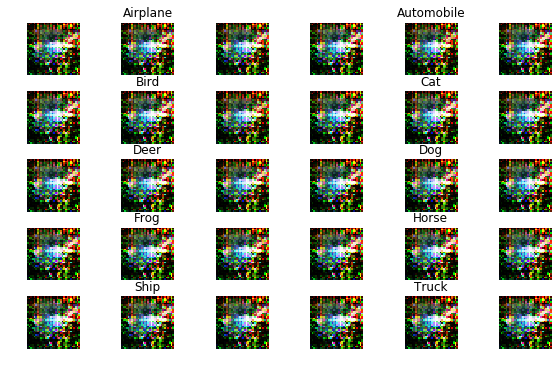

	Epoch: 67, Generator Loss: 0.013657219085693359, Discriminator Loss: [0.00099017 0.        ]


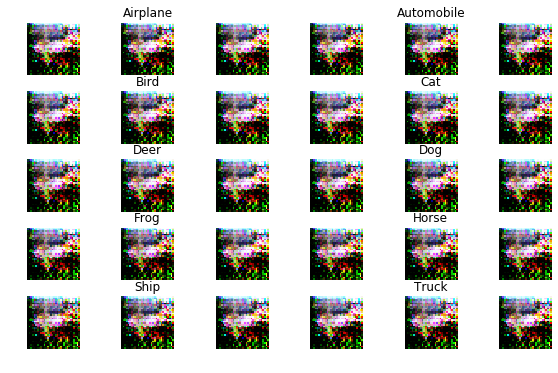

	Epoch: 68, Generator Loss: 0.014507139129638672, Discriminator Loss: [0.0010181 0.       ]


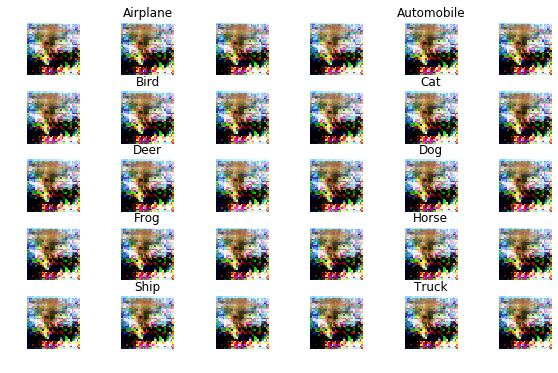

	Epoch: 69, Generator Loss: 0.01653505790710449, Discriminator Loss: [0.00100171 0.        ]


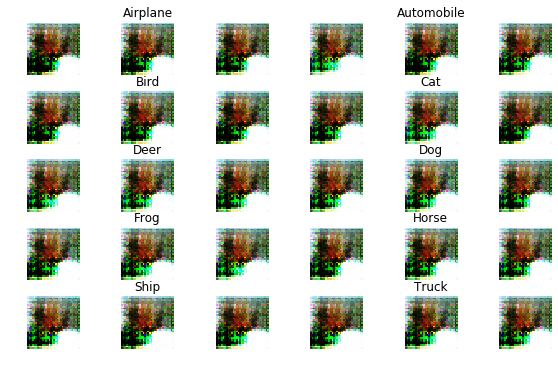

	Epoch: 70, Generator Loss: 0.014974788589477539, Discriminator Loss: [0.00105737 0.        ]


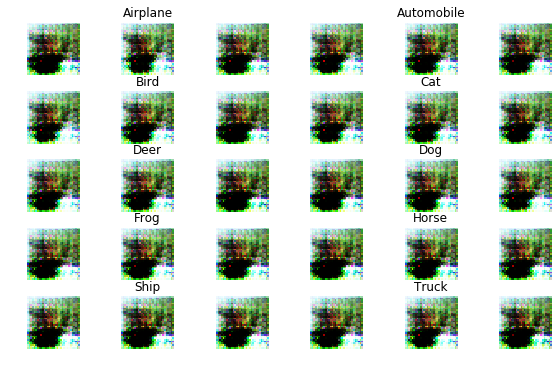

	Epoch: 71, Generator Loss: 0.014646518859863282, Discriminator Loss: [0.00095704 0.        ]


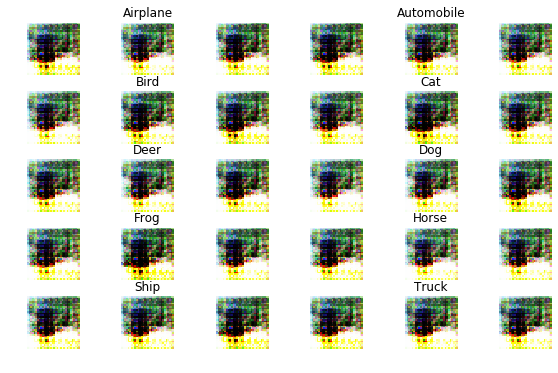

	Epoch: 72, Generator Loss: 0.014974038314819336, Discriminator Loss: [0.00112098 0.        ]


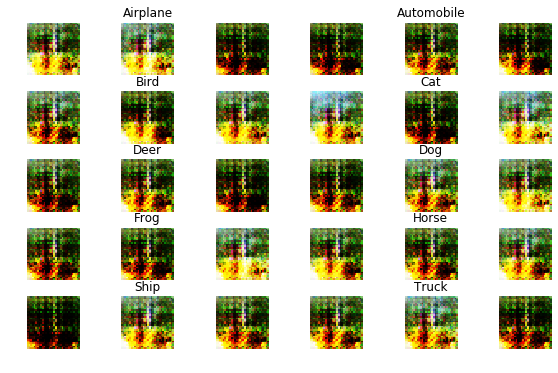

	Epoch: 73, Generator Loss: 0.013983480796813965, Discriminator Loss: [0.00112013 0.        ]


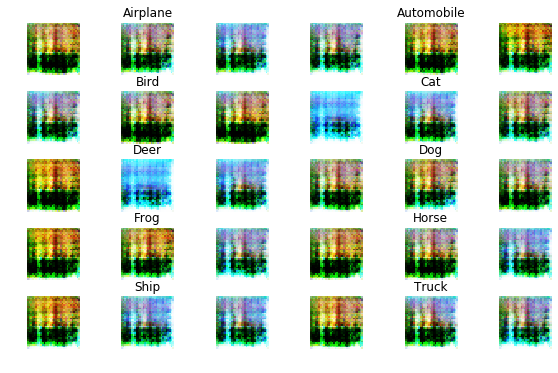

	Epoch: 74, Generator Loss: 0.013980655899047852, Discriminator Loss: [0.00110507 0.        ]


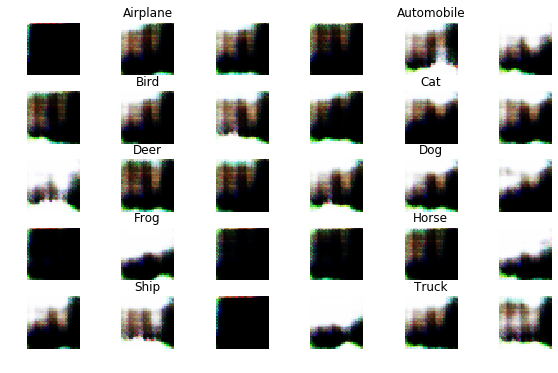

	Epoch: 75, Generator Loss: 0.009066359395980834, Discriminator Loss: [0.00117762 0.        ]


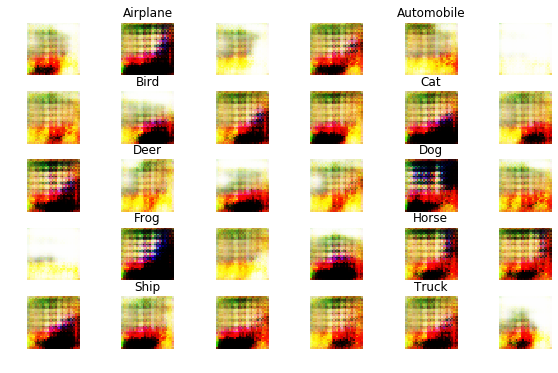

	Epoch: 76, Generator Loss: 0.013909081573486328, Discriminator Loss: [0.00118621 0.        ]


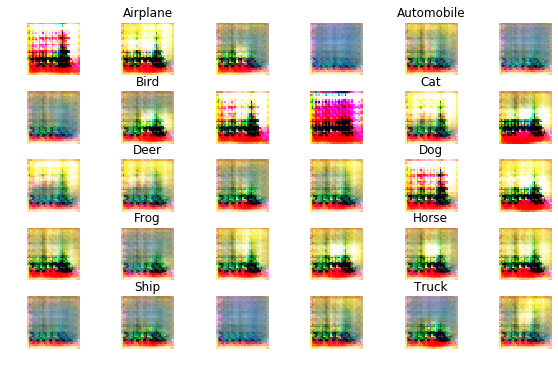

	Epoch: 77, Generator Loss: 0.009787481021881103, Discriminator Loss: [0.00115663 0.        ]


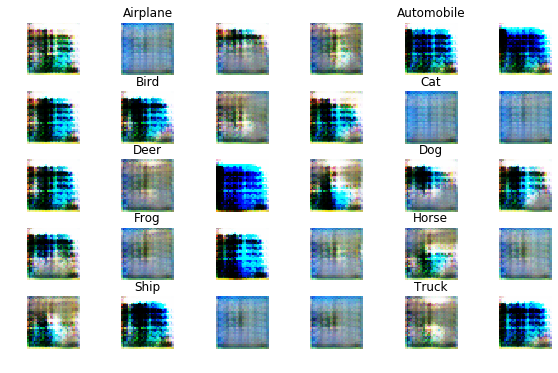

	Epoch: 78, Generator Loss: 0.009754819068908691, Discriminator Loss: [0.0016025 0.       ]


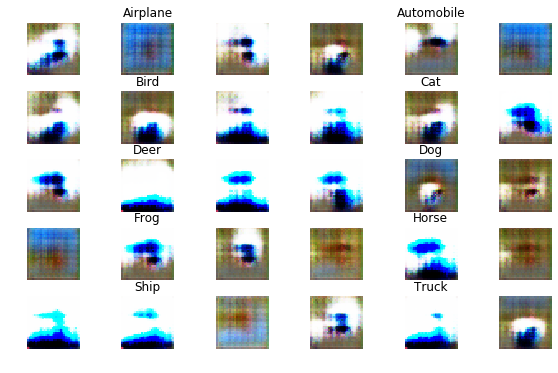

	Epoch: 79, Generator Loss: 0.006528039493560791, Discriminator Loss: [0.00195149 0.        ]


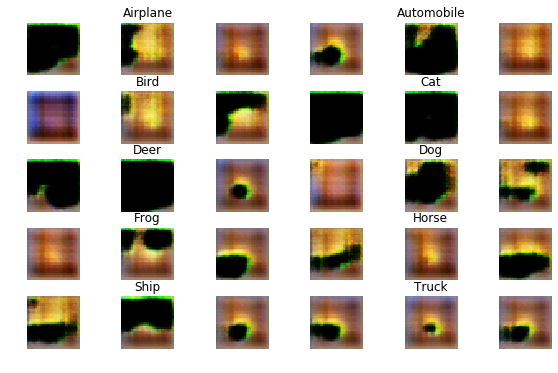

	Epoch: 80, Generator Loss: 0.010703524284362793, Discriminator Loss: [0.00129264 0.        ]


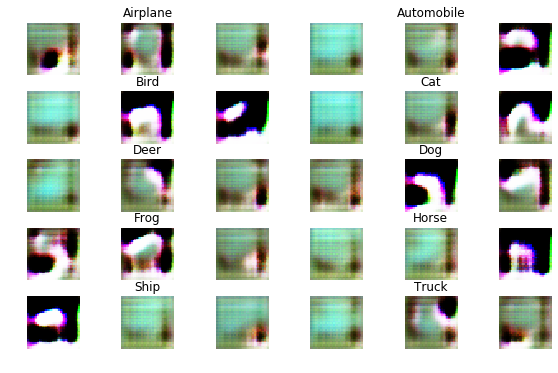

	Epoch: 81, Generator Loss: 0.011780804748535156, Discriminator Loss: [0.00150152 0.        ]


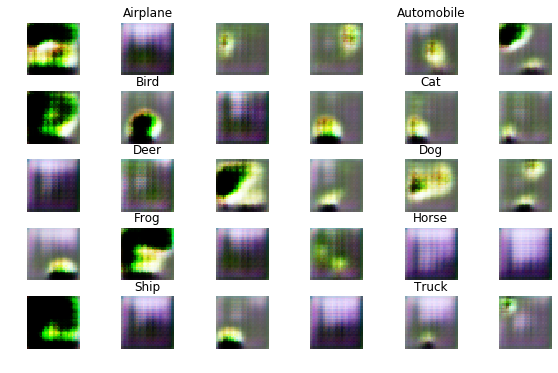

	Epoch: 82, Generator Loss: 0.013182278976440429, Discriminator Loss: [0.0012741 0.       ]


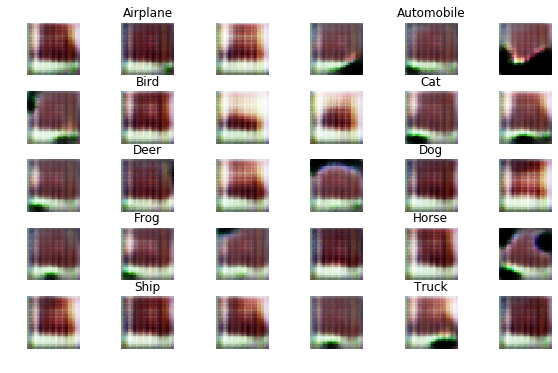

	Epoch: 83, Generator Loss: 0.011333808555603028, Discriminator Loss: [0.00145784 0.        ]


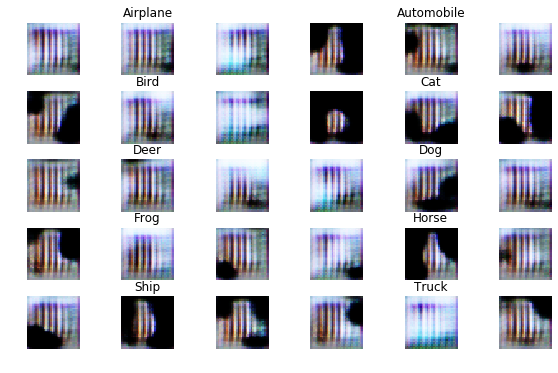

	Epoch: 84, Generator Loss: 0.012258415908813476, Discriminator Loss: [0.00125993 0.        ]


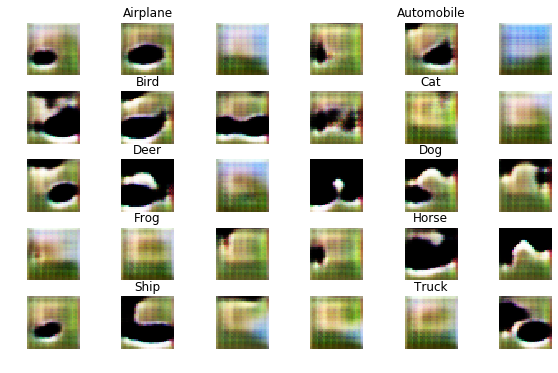

	Epoch: 85, Generator Loss: 0.012279185104370116, Discriminator Loss: [0.00112273 0.        ]


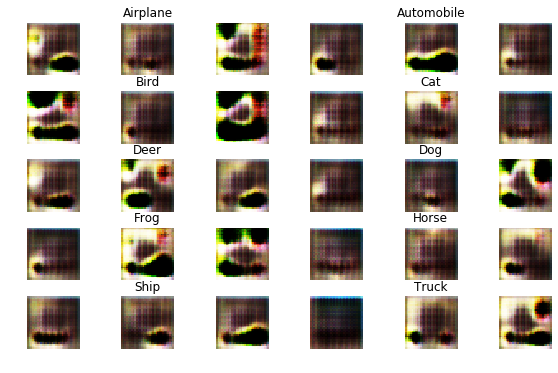

	Epoch: 86, Generator Loss: 0.009723496417999267, Discriminator Loss: [0.0011791 0.       ]


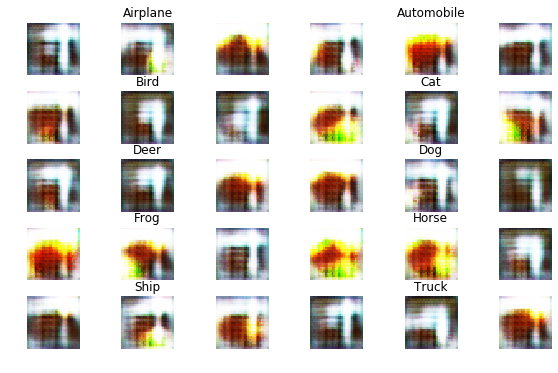

	Epoch: 87, Generator Loss: 0.011348753204345703, Discriminator Loss: [0.00144333 0.        ]


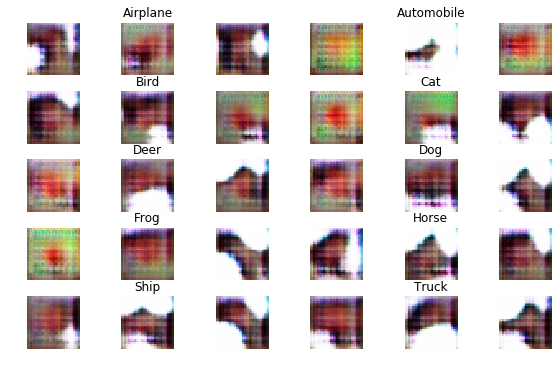

	Epoch: 88, Generator Loss: 0.010175577621459962, Discriminator Loss: [0.00130268 0.        ]


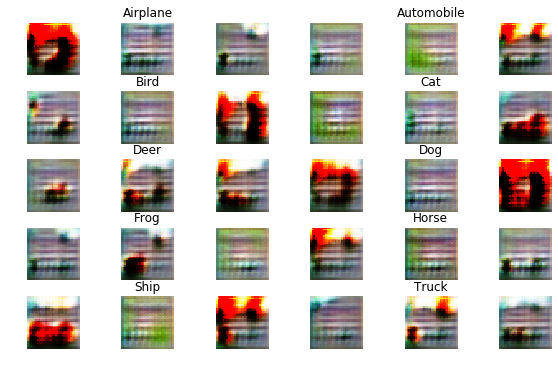

	Epoch: 89, Generator Loss: 0.008474930610656739, Discriminator Loss: [0.00127139 0.        ]


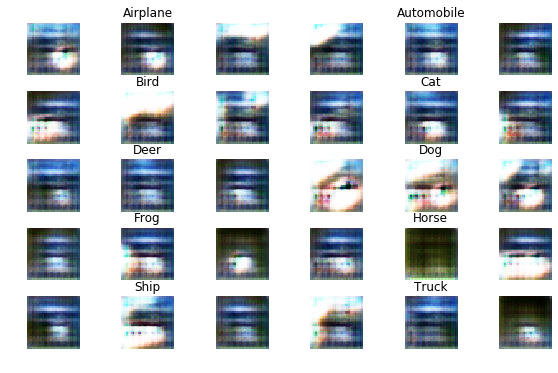

	Epoch: 90, Generator Loss: 0.009351184425354004, Discriminator Loss: [0.00119055 0.        ]


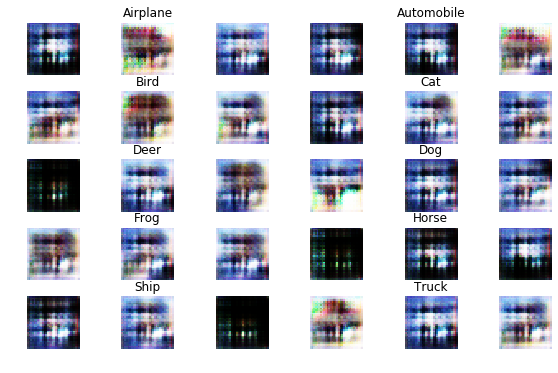

	Epoch: 91, Generator Loss: 0.010745409774780274, Discriminator Loss: [0.00124641 0.        ]


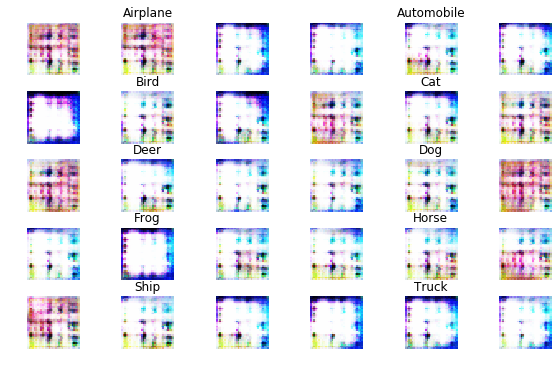

	Epoch: 92, Generator Loss: 0.011389538536071777, Discriminator Loss: [0.00108854 0.        ]


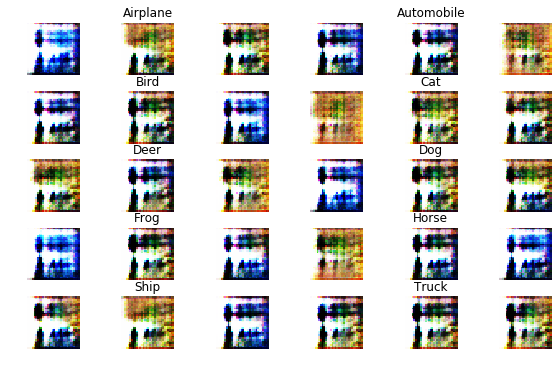

	Epoch: 93, Generator Loss: 0.01466861442565918, Discriminator Loss: [0.00114162 0.        ]


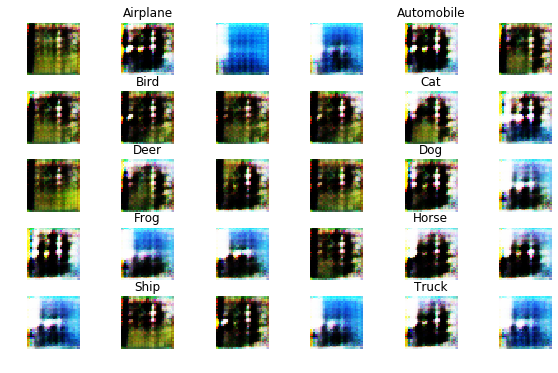

	Epoch: 94, Generator Loss: 0.011872943344116212, Discriminator Loss: [0.0012163 0.       ]


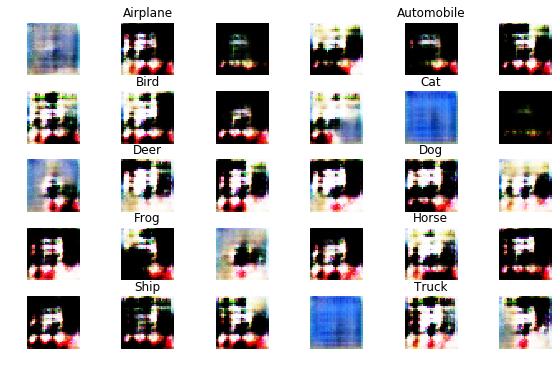

	Epoch: 95, Generator Loss: 0.013232477798461914, Discriminator Loss: [0.00131555 0.        ]


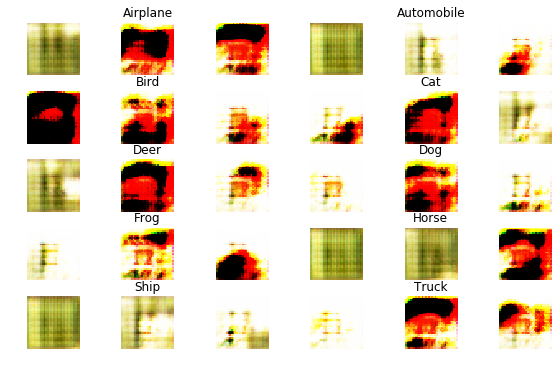

	Epoch: 96, Generator Loss: 0.008127753925323486, Discriminator Loss: [0.001375 0.      ]


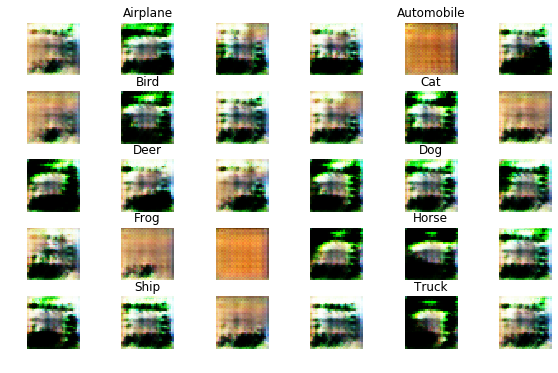

	Epoch: 97, Generator Loss: 0.010988057785034179, Discriminator Loss: [0.00136218 0.        ]


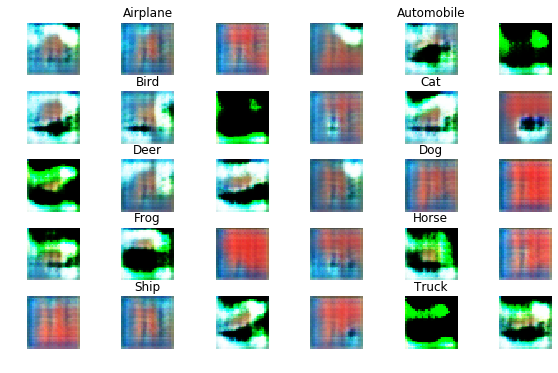

	Epoch: 98, Generator Loss: 0.01181069595336914, Discriminator Loss: [0.00118006 0.        ]


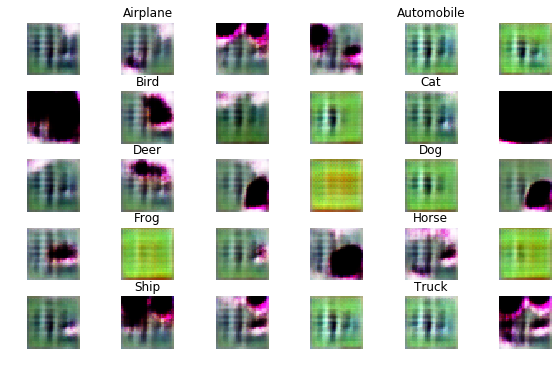

	Epoch: 99, Generator Loss: 0.011312514553070068, Discriminator Loss: [0.00121335 0.        ]


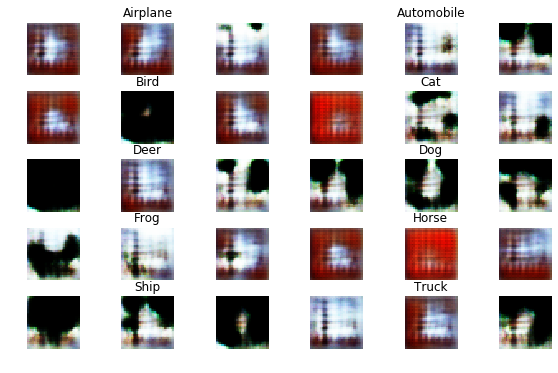

	Epoch: 100, Generator Loss: 0.012683059120178223, Discriminator Loss: [0.00131715 0.        ]


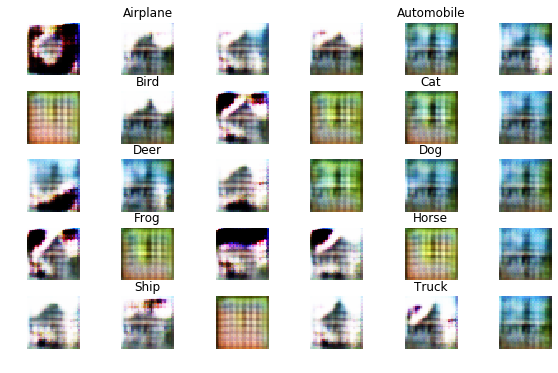

In [17]:

N_EPOCHS = 100
for epoch in range(N_EPOCHS):

  cum_d_loss = 0.
  cum_g_loss = 0.
  
  for batch_idx in range(num_batches):
    
    images = X_train[batch_idx*BATCH_SIZE : (batch_idx+1)*BATCH_SIZE]
    labels = y_train[batch_idx*BATCH_SIZE : (batch_idx+1)*BATCH_SIZE]

    noise_data = generate_noise(BATCH_SIZE, 100)
    random_labels = generate_random_labels(BATCH_SIZE)
    
    generated_images = generator.predict([noise_data, labels])

    
    noise_prop = 0.05 
    
    
    true_labels = np.zeros((BATCH_SIZE, 1)) + np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
    flipped_idx = np.random.choice(np.arange(len(true_labels)), size=int(noise_prop*len(true_labels)))
    true_labels[flipped_idx] = 1 - true_labels[flipped_idx]
    
    
    d_loss_true = discriminator.train_on_batch([images, labels], true_labels)

    
    gene_labels = np.ones((BATCH_SIZE, 1)) - np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
    flipped_idx = np.random.choice(np.arange(len(gene_labels)), size=int(noise_prop*len(gene_labels)))
    gene_labels[flipped_idx] = 1 - gene_labels[flipped_idx]
    
    
    d_loss_gene = discriminator.train_on_batch([generated_images, labels], gene_labels)
    
    
    r_idx = np.random.randint(BATCH_SIZE)
    exp_replay.append([generated_images[r_idx], labels[r_idx], gene_labels[r_idx]])
    
    
    if len(exp_replay) == BATCH_SIZE:
      generated_images = np.array([p[0] for p in exp_replay])
      labels = np.array([p[1] for p in exp_replay])
      gene_labels = np.array([p[2] for p in exp_replay])
      expprep_loss_gene = discriminator.train_on_batch([generated_images, labels], gene_labels)
      exp_replay = []
      break
    
    d_loss = 0.5 * np.add(d_loss_true, d_loss_gene)
    cum_d_loss += d_loss

    
    noise_data = generate_noise(BATCH_SIZE, 100)
    random_labels = generate_random_labels(BATCH_SIZE)
    g_loss = gan.train_on_batch([noise_data, random_labels, random_labels], np.zeros((BATCH_SIZE, 1)))
    cum_g_loss += g_loss

  print('\tEpoch: {}, Generator Loss: {}, Discriminator Loss: {}'.format(epoch+1, cum_g_loss/num_batches, cum_d_loss/num_batches))
  show_samples("epoch" + str(epoch))
  
  
  if epoch%50==0:
    generator.save('generator'+str(epoch)+'.h5')
    gan.save('gan.h5')
    

In [18]:
!ls

gan.h5	generator0.h5  generator50.h5  sample_data


In [0]:
generator.save('final_generator.h5')

In [0]:
generator.save('final_gan.h5')

In [21]:
!cp -r "final_generator.h5" '/content/gdrive/My Drive/SketchyGAN/'

cp: cannot create regular file '/content/gdrive/My Drive/SketchyGAN/': No such file or directory


In [22]:
!ls


final_gan.h5	    gan.h5	   generator50.h5
final_generator.h5  generator0.h5  sample_data


In [23]:
!cp -r "final_generator.h5" '/content/gdrive/My Drive/'

cp: cannot create regular file '/content/gdrive/My Drive/': No such file or directory


In [0]:
from google.colab import drive

In [25]:
drive.mount('/content/gdrive')



Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!cp -r "final_generator.h5" '/content/gdrive/My Drive/SketchyGAN/'

In [0]:
!cp -r "final_gan.h5" '/content/gdrive/My Drive/SketchyGAN/'

In [0]:
discriminator.save('final_disc.h5')
!cp -r "final_disc.h5" '/content/gdrive/My Drive/SketchyGAN/'